In [1]:
model_path = '../tmp/tflite_model.tflite'

import cv2 as cv
from test_tflite import Tester
from matplotlib import pyplot as plt
from utils.util import *
from matplotlib import pyplot as plt
from pathlib import Path

In [10]:
import matplotlib
matplotlib.__version__

'3.1.3'

# test one image with given path

If showing within Jupyter notebook is not necessary, ignore the current code and run the code below:
<pre><code>
save_dir = '../test_result'
image_path = '../data/KITTI/testing/image_2/IMG_7178.jpg'
tester = Tester(model_path, save_dir = save_dir)
image =  cv.resize(cv.imread(image_path), tuple(tester.image_size[::-1]))
det_results = tester.test_one_image(image, save_result=True, save_name = Path(image_path).name)
</code></pre>

In [14]:
image_path = '../data/KITTI/testing/image_2/IMG_7178.jpg'
def draw_boxes(image, det_boxes, det_probs, det_classes, color):
    for bbox, prob, det_class in zip(det_boxes, det_probs, det_classes):
        label = det_class+': (%.2f)' % prob
        xmin, ymin, xmax, ymax = [int(b) for b in bbox_transform(bbox)]
        cv.rectangle(image, (xmin, ymin), (xmax, ymax), color, 1)
        cv.putText(image, label, (xmin, ymax), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

In [15]:
tester = Tester(model_path=model_path)
image = cv.resize(cv.imread(image_path), tuple(tester.image_size[::-1]))
det_results = tester.test_one_image(image)
class_list = [tester.mc.CLASS_NAMES[class_idx] for class_idx in det_results['classes']]
draw_boxes(image, det_results['boxes'], det_results['probs'],class_list, color = (255,0,0))

## visualize result

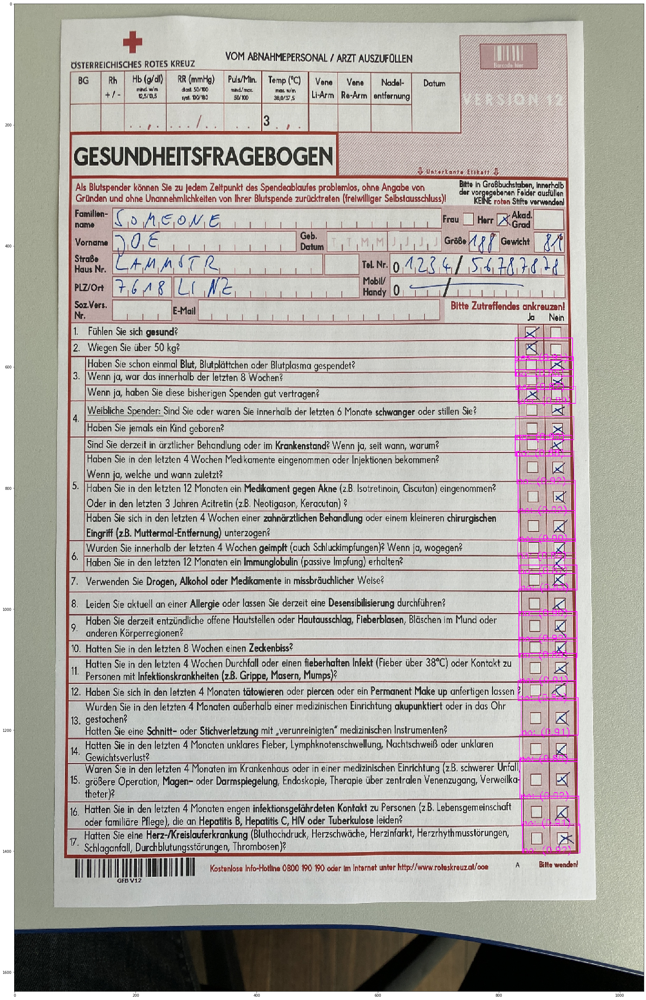

In [8]:
plt.figure(figsize = (400,50))
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))

## test images under a folder



In [5]:
save_dir = '../test_result'
image_dir = '../data/KITTI/testing'

det_results = Tester(model_path, image_dir, save_dir).test_images(save_result=True)